# Pipeline for image size estimation

Imports

In [1]:
# basics
import numpy as np
import pandas as pd
import math
from tqdm import tqdm
# file work
import os
import json
# computer vision
import cv2
import torch
import laser_detection as ld
# models
from segment_anything import sam_model_registry, SamPredictor
from easy_ViTPose import VitInference
from huggingface_hub import hf_hub_download

/cluster/tufts/fuzzywuzzy/jbrand12/condaenv/fzwz/lib/python3.9/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


## Step 0: Assign input point to each image

run: 'python3 label.py' to get json of image names and input points (change path to folder in script)

## Step 1: Load image data from json

The below are modifiable variables you can change depending on what dataset you are running

In [2]:
# ALL DATA
# json_file = '../data/red_laser_data.json'  # must contain input labels
# image_folder = '../data/red_laser_data'
# mask_folder = '../data/red_laser_data_masks'  # can be empty to start

# SAMPLE DATA
json_file = 'sample_data/red_lasers/sample_data.json'  # must contain input labels
image_folder = 'sample_data/red_lasers/sample_data'
mask_folder = 'sample_data/red_lasers/sample_data_masks'  # can be empty to start

# load data
with open(json_file, 'r') as file:
    image_data = json.load(file)

In [3]:
len(image_data)

8

Some helper functions for displaying images

In [4]:
# function to show mask
def show_mask(mask, ax):
    color = np.array([30/255, 144/255, 255/255, 0.6])
    h, w = mask.shape[-2:]
    mask_image = mask.reshape(h, w, 1) * color.reshape(1, 1, -1)
    ax.imshow(mask_image)

# function to show input point
def show_points(points, ax):
    ax.scatter(points[:, 0], points[:, 1], color='blue', marker='*', s=250, edgecolor='white', linewidth=1.25)

### let's visualize labels from json

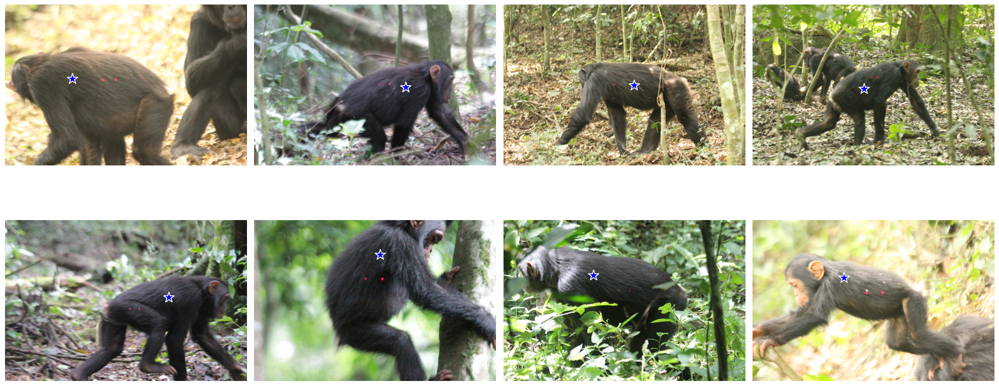

In [5]:
import matplotlib.pyplot as plt
fig, axs = plt.subplots(2, 4, figsize=(20, 10))

# flatten axes for easy indexing
axs = axs.flatten()

idx = 0
# iterate through each entry in json
for image_name, im_data in image_data.items():
    image_path = os.path.join(image_folder, image_name)
    # load image
    img = cv2.imread(image_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)  # Convert BGR to RGB for plotting

    if img is not None:
        # extract coordinates
        input_point = np.array([im_data['input_point']])

        # plot image
        axs[idx].imshow(img)
        show_points(input_point, axs[idx])
        axs[idx].axis('off')

        idx += 1
    else:
        print(f"Could not load image: {image_name}")

plt.tight_layout()
plt.show()

Looks good!

## Step 2: Run images through SAM to prep for laser detection

### ***only need to run this code once to get masks!!!

Set up SAM

In [6]:
# select checkpoint and model type
sam_checkpoint = "../sam_vit_h_4b8939.pth"
model_type = "vit_h"

# define predictor
sam = sam_model_registry[model_type](checkpoint=sam_checkpoint)

# change device if cuda is available
if torch.cuda.is_available():
    sam.to(device='cuda')

predictor = SamPredictor(sam)

In [7]:
def generate_mask(im, input_point):
    input_label = np.array([1])
    predictor.set_image(im)
    masks, scores, _ = predictor.predict(point_coords=input_point, point_labels=input_label, multimask_output=True)
    # return best mask
    return masks[np.argmax(scores)]

Iterate through images and get mask

In [8]:
from tqdm import tqdm
# iterate through each entry in the JSON data
for image_name, im_data in tqdm(image_data.items(), desc="Processing Images"):
    image_path = os.path.join(image_folder, image_name)
    
    # Load the image
    img = cv2.imread(image_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    
    if img is not None:
        # extract coordinates
        input_point = np.array([im_data['input_point']])
        # Generate the mask
        mask = generate_mask(img, input_point)
        mask = mask.astype(np.uint8)
        
        # Define the mask filename
        mask_filename = os.path.splitext(image_name)[0] + "_mask.png"
        mask_path = os.path.join(mask_folder, mask_filename)
        
        # Save the mask
        cv2.imwrite(mask_path, mask)
        
        # Update the JSON data with the mask filename
        image_data[image_name]['mask'] = mask_filename

Processing Images: 100%|██████████| 8/8 [00:05<00:00,  1.47it/s]


viewing masks: 100%|██████████| 8/8 [00:03<00:00,  2.60it/s]


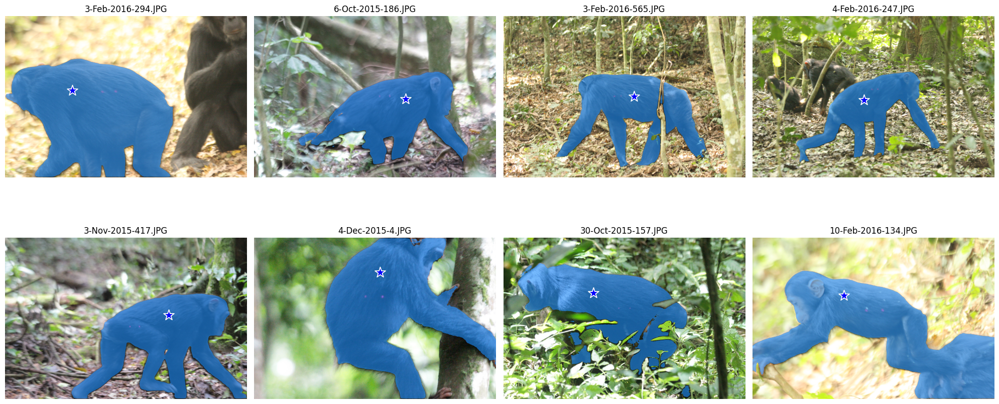

In [9]:
fig, axs = plt.subplots(2, 4, figsize=(20, 10))

# flatten axes for easy indexing
axs = axs.flatten()

idx = 0
# iterate through each entry in json
for image_name, im_data in tqdm(image_data.items(), desc="viewing masks"):
    image_path = os.path.join(image_folder, image_name)
    # load image
    img = cv2.imread(image_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)  # Convert BGR to RGB for plotting

    # Load the mask
    mask_filename = im_data['mask']
    mask_path = os.path.join(mask_folder, mask_filename)
    mask = cv2.imread(mask_path, cv2.IMREAD_GRAYSCALE)  # Load mask in grayscale

    if img is not None:
        input_point = np.array([im_data['input_point']])

        # plot image
        axs[idx].imshow(img)
        show_points(input_point, axs[idx])
        show_mask(mask, axs[idx])
        axs[idx].axis('off')
        axs[idx].set_title(image_name)

        idx += 1
    else:
        print(f"Could not load image: {image_name}")

plt.tight_layout()
plt.show()

Good stuff

## Step 3: Run VitPose

In [15]:
def draw_dots(points, ax, color):
    ax.scatter(points[:, 0], points[:, 1], color=color, s=10)

In [10]:
# define model parameters
MODEL_SIZE = 'h'
YOLO_SIZE = 'n'
DATASET = 'apt36k'
ext = '.pth'
ext_yolo = '.pt'

# download model_path and yolo_path
MODEL_TYPE = "torch"
YOLO_TYPE = "torch"
REPO_ID = 'JunkyByte/easy_ViTPose'
FILENAME = os.path.join(MODEL_TYPE, 
                        f'{DATASET}/vitpose-' + MODEL_SIZE + f'-{DATASET}') + ext
FILENAME_YOLO = 'yolov8/yolov8' + YOLO_SIZE + ext_yolo
print(f'Downloading model {REPO_ID}/{FILENAME}')
model_path = hf_hub_download(repo_id=REPO_ID, filename=FILENAME)
yolo_path = hf_hub_download(repo_id=REPO_ID, filename=FILENAME_YOLO)

In [11]:
# initialize model
model = VitInference(model_path, yolo_path, MODEL_SIZE, dataset=DATASET)

In [12]:
# iterate through each entry in json
for image_name, info in tqdm(image_data.items(), desc="ViTPose"):
    image_path = os.path.join(image_folder, image_name)
    # load image
    img = cv2.imread(image_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)  # Convert BGR to RGB for plotting

    # get keypoints
    img_arr = np.array(img, dtype=np.uint8)
    keypoints = model.inference(img_arr)

    if keypoints:
        # store results
        shoulder = (keypoints[0][3][1], keypoints[0][3][0])
        rump = (keypoints[0][4][1], keypoints[0][4][0])
      
        # Update the JSON data with shoulder and rump
        image_data[image_name]['shoulder_rump'] = [shoulder, rump]
    else:
        print(f"vitpose failed for {image_path}")
        # TODO how do we want to handle this case in the json?
        image_data[image_name]['shoulder_rump'] = None

ViTPose:  75%|███████▌  | 6/8 [00:01<00:00,  5.07it/s]

vitpose failed for sample_data/red_lasers/sample_data/3-Nov-2015-417.JPG


ViTPose: 100%|██████████| 8/8 [00:01<00:00,  4.10it/s]


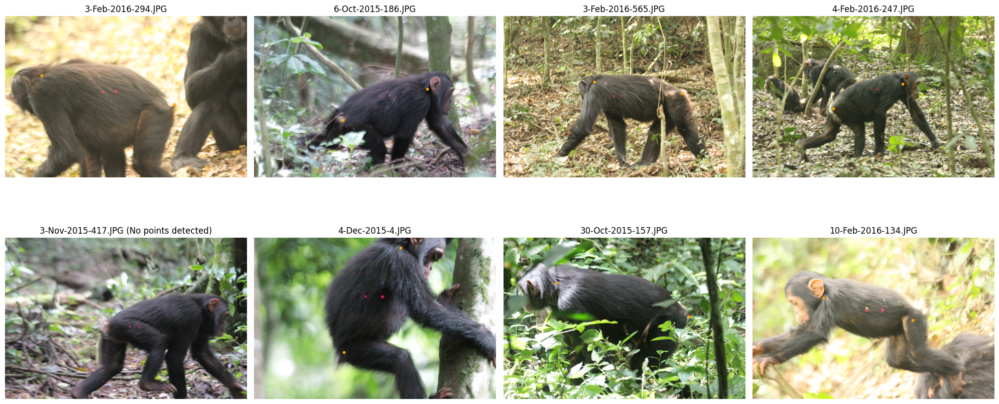

In [16]:
fig, axs = plt.subplots(2, 4, figsize=(20, 10))

# flatten axes for easy indexing
axs = axs.flatten()

idx = 0
# iterate through each entry in json
for image_name, info in image_data.items():
    image_path = os.path.join(image_folder, image_name)
    # load image
    img = cv2.imread(image_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)  # Convert BGR to RGB for plotting

    # extract coordinates
    body_points = info['shoulder_rump']

    # plot image
    axs[idx].imshow(img)
    if body_points:
        draw_dots(np.array(body_points), axs[idx], 'orange')
        axs[idx].set_title(image_name)
    else:
        axs[idx].set_title(f"{image_name} (No points detected)")
    axs[idx].axis('off')

    idx += 1

plt.tight_layout()
plt.show()

## Step 4: laser point detection

In [19]:
# Function to compute y from x using the line equation
def compute_y(x, slope, intercept):
    return int(slope * x + intercept)

# Function to create the mask with actual image dimensions
def create_geo_mask(point1, point2, image_height=1728, image_width=2592):
    # Calculate the slope and intercept of the line between the points
    dx = point2[0] - point1[0]
    dy = point2[1] - point1[1]
    slope = dy / dx if dx != 0 else None

    # Calculate the perpendicular slopes
    if slope is not None:
        perpendicular_slope = -1 / slope
        # Calculate the intercept for the perpendicular lines
        intercept1 = point1[1] - (perpendicular_slope * point1[0])
        intercept2 = point2[1] - (perpendicular_slope * point2[0])
    else:
        # If the line is vertical, the perpendiculars will be horizontal
        perpendicular_slope = 0
        intercept1 = point1[1]
        intercept2 = point2[1]

    # Create an empty mask
    mask = np.zeros((image_height, image_width), dtype=np.uint8)

    # Fill the mask
    for x in range(image_width):
        if slope is not None:
            y_from_point1 = compute_y(x, perpendicular_slope, intercept1)
            y_from_point2 = compute_y(x, perpendicular_slope, intercept2)
        else:
            # If original line is vertical, fill entire column for mask
            y_from_point1, y_from_point2 = 0, image_height - 1

        # Ensure the y values are within image boundaries
        y_from_point1 = np.clip(y_from_point1, 0, image_height - 1)
        y_from_point2 = np.clip(y_from_point2, 0, image_height - 1)

        if y_from_point1 < y_from_point2:
            mask[y_from_point1:y_from_point2, x] = 255
        else:
            mask[y_from_point2:y_from_point1, x] = 255

    return mask

In [20]:
import cProfile
import pstats

In [33]:
import importlib
importlib.reload(ld)

# profile = cProfile.Profile()
# profile.enable()

# iterate through each entry in json
for image_name, info in tqdm(image_data.items(), desc="detecting lasers"):
    image_path = os.path.join(image_folder, image_name)
    # load image
    source = cv2.imread(image_path)

    # geo mask
    sr = info['shoulder_rump']
    if sr:
        point1, point2 = sr[0], sr[1]
        geo_mask = create_geo_mask(point1, point2, source.shape[0], source.shape[1])
    else:
        geo_mask = np.ones(source.shape[:2])

    # body mask
    mask_filename = info['mask']
    mask_path = os.path.join(mask_folder, mask_filename)
    body_mask = cv2.imread(mask_path, cv2.IMREAD_GRAYSCALE)  # Load mask in grayscale

    mask = cv2.bitwise_and(geo_mask, body_mask)
    mask = mask > 0  # need to convert to boolean values

    # adjust accodringly
    points = ld.detect_red_laser_points(source, mask)

    # Update the JSON data with the mask filename
    image_data[image_name]['laser_points'] = points
        
# profile.disable()
# ps = pstats.Stats(profile).sort_stats('cumulative')
# ps.print_stats()

detecting lasers:  50%|█████     | 4/8 [00:36<00:36,  9.10s/it]


error: OpenCV(4.8.0) /io/opencv/modules/core/src/arithm.cpp:212: error: (-209:Sizes of input arguments do not match) The operation is neither 'array op array' (where arrays have the same size and type), nor 'array op scalar', nor 'scalar op array' in function 'binary_op'


let's checkout the results

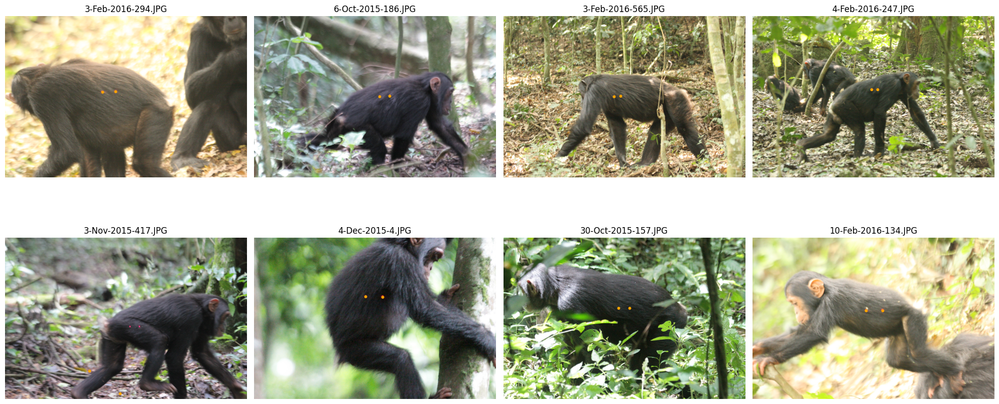

In [34]:
fig, axs = plt.subplots(2, 4, figsize=(20, 10))

# flatten axes for easy indexing
axs = axs.flatten()

idx = 0
# iterate through each entry in json
for image_name, info in image_data.items():

    image_path = os.path.join(image_folder, image_name)
    # load image
    img = cv2.imread(image_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)  # Convert BGR to RGB for plotting

    # extract coordinates
    points = np.array(info['laser_points'])

    # plot image
    axs[idx].imshow(img)
    if len(points == 2):
        draw_dots(points, axs[idx], "orange")
        axs[idx].set_title(image_name)
    else:
        axs[idx].set_title(f"{image_name} - {len(points)} point/s detected")
    axs[idx].axis('off')

    idx += 1

plt.tight_layout()
plt.show()

### Step 5: get distances

In [35]:
measured_df = pd.read_csv('../data/measured.csv')
measured_df = measured_df.dropna(subset=['PhotoID'])

Get dictionaries for conversions

In [36]:
laser_width = dict(zip(measured_df['PhotoID'], measured_df['Laser Width']))
body_length = dict(zip(measured_df['PhotoID'], measured_df['BodyLength1']))
pix_laser = dict(zip(measured_df['PhotoID'], measured_df['PixLaser1']))
pix_length = dict(zip(measured_df['PhotoID'], measured_df['PixLength1']))

In [37]:
# iterate through each entry in json
for image_name, info in image_data.items():
    try:
        # truth distances in pixels
        laser_points = info['laser_points']
        body_points = info['shoulder_rump']

        laser_dist = round(math.dist(laser_points[0], laser_points[1]), 1)
        body_dist = round(math.dist(body_points[0], body_points[1]), 1)

        # spreadsheet distances
        ss_laser_dist = pix_laser[image_name.split('.')[0]]
        ss_body_dist = pix_length[image_name.split('.')[0]]
        print(f"Our laser: {laser_dist}\t Our body: {body_dist}")
        print(f"Csv laser: {ss_laser_dist}\t Csv body: {ss_body_dist}\n")
    except:
        pass

Our laser: 216.1	 Our body: 2189.2
Csv laser: 213.0	 Csv body: 2319.0

Our laser: 108.0	 Our body: 965.7
Csv laser: 108.0	 Csv body: 930.0

Our laser: 105.1	 Our body: 1424.5
Csv laser: 110.03	 Csv body: 1583.02

Our laser: 94.0	 Our body: 1184.3
Csv laser: 96.0	 Csv body: 1164.0

Our laser: 182.0	 Our body: 1275.2
Csv laser: 181.0	 Csv body: 1341.0

Our laser: 121.0	 Our body: 1471.9
Csv laser: 121.0	 Csv body: 1373.0

Our laser: 262.0	 Our body: 1480.0
Csv laser: 263.0	 Csv body: 1637.0



In [39]:
errors = []
# iterate through each entry in json
for image_name, info in tqdm(image_data.items(), desc="Calculating Final Distances"):
    try:
        # distances in pixels
        laser_points = info['laser_points']
        body_points = info['shoulder_rump']

        # calculate ratio
        laser_dist = round(math.dist(laser_points[0], laser_points[1]), 1)
        body_dist = round(math.dist(body_points[0], body_points[1]), 1)
        ratio = laser_dist / body_dist

        # lookup laser width
        photo_id = image_name.split('.')[0]
        laser_in = laser_width[photo_id]
        # compare results
        predicted_length = laser_in / ratio
        true_length = body_length[photo_id]
        error = round(abs(predicted_length - true_length) / true_length, 3)
        errors.append(error*100)
        print(f"Predicted: {predicted_length}\t Actual: {true_length}\t Error = {error}")
    except:
        pass

Calculating Final Distances: 100%|██████████| 8/8 [00:00<00:00, 33123.82it/s]

Predicted: 46.60027764923645	 Actual: 50.08169014	 Error = 0.07
Predicted: 41.13166666666667	 Actual: 39.61111111	 Error = 0.038
Predicted: 62.347288296860135	 Actual: 66.18096883	 Error = 0.058
Predicted: 57.95510638297871	 Actual: 55.775	 Error = 0.039
Predicted: 32.23032967032967	 Actual: 34.08066298	 Error = 0.054
Predicted: 55.956528925619835	 Actual: 52.19669421	 Error = 0.072
Predicted: 25.98473282442748	 Actual: 28.63193916	 Error = 0.092


In [40]:
print("mean:", np.mean(errors))
print("median:", np.median(errors))
print("std:", np.std(errors))

mean: 6.042857142857143
median: 5.800000000000001
std: 1.7855428489134957


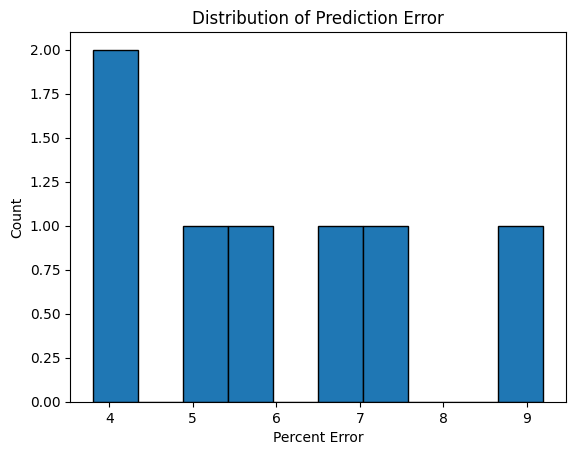

In [42]:
import matplotlib.pyplot as plt
plt.hist(errors, bins=10, edgecolor='black')
plt.xlabel("Percent Error")
plt.ylabel("Count")
plt.title("Distribution of Prediction Error")
plt.show()